In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import Unet2 as Unet
import roma
from tqdm import tqdm
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [2]:
import torchvision
import torch.nn.functional as F
def gauss_newton(x, residuals, damping=1., iterations=5):
    x_list = []
    # Unroll a number of iterations of Gauss-Newton.
    for i in range(0, iterations):
        # Compute the gauss-newton updates.
        # We cannot easily backpropagate through computing the Jacobian. However, we don't need to.
        # We can disconnect from the computation graph, and then re-attach at each iteration.
        with torch.no_grad():
            r = torch.atleast_1d(residuals(x))
            J = torch.nan_to_num(torch.atleast_2d(torch.autograd.functional.jacobian(residuals, x)),0)
            # https://en.wikipedia.org/wiki/Gauss–Newton_algorithm
            u = torch.linalg.lstsq(J.T @ J, J.T @ r).solution
        # Update x, and in doing so, connect the update step to the computation graph.
        # This allows an outer optimization loop to compute the derivative of the loss with respect to the inputs.
        x = x - damping * u
        x_list.append(x)
    # return x
    return x_list
def backproject(depth, K):
    """
    Backproject a depth map into 3D space with normalized intrinsic matrix K.
    The depth map should be normalized between (min_depth, max_depth).
    """
    height, width = depth.shape[-2], depth.shape[-1]
    size = height * width
    y = torch.linspace(0, 1, height, device=depth.device)
    x = torch.linspace(0, 1, width,  device=depth.device)
    u, v = torch.meshgrid(x, y, indexing='xy')
    ones = torch.ones(size, device=depth.device)
    points = torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1)
    points = torch.linalg.inv(K) @ points
    return points * depth.view(-1, size, 1, 1)


def project(points, K, height, width, invert=False):
    coords = K @ points
    coords = perspective(coords)
    coords = coords.view(-1, height, width, 2)
    coords = (coords - 0.5) * 2
    return coords


def perspective(points):
    """
    Perspective division
    """
    return points[..., :-1, :] / (points[..., [-1], :] + 1e-7)


def transform(points, R,t, invert=False):
    """
    Project points to camera reference frame
    """
    # R, t = pose
    if invert:
        return R.mT @ (points - t)
    else:
        return R @ points + t


def disparity_to_depth(disparity, min_depth=0.1, max_depth=100.0):
    min_disparity = 1 / max_depth
    max_disparity = 1 / min_depth
    scaled = min_disparity + (max_disparity - min_disparity) * disparity
    depth = 1 / scaled
    return depth
def pix_coords(height, width, device):
    size = height * width
    y = torch.linspace(-1, 1, height, device=device)
    x = torch.linspace(-1, 1, width, device=device)
    u, v = torch.meshgrid(x, y, indexing='xy')
    ones = torch.ones(size, device=device)
    # print("torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1)", torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1))
    # x,y,z=depth 
    return torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1)


def warp(homography, image, padding_mode="border"):
    height, width = image.shape[-2:]
    coords = pix_coords(height, width, device=device)
    warped = project(homography @ coords, height, width)

    warped = F.grid_sample(image, warped, padding_mode=padding_mode, align_corners=False)
    # print("gridsampled warped:", warped.shape)
    # backprojection 
    return warped


def reproject(depth, image, K, R, t):
    points_3d = backproject(depth, K)
    points_3d = transform(points_3d, R, t)
    points_2d = project(points_3d, K, depth.shape[-2], depth.shape[-1])
    output = F.grid_sample(image, points_2d, padding_mode="zeros", align_corners=False)
    return output


# def residuals(params):
#     """
#     Return the loss of aligning image_1 to image_0 with homography (params).
    
#     TODO: Replace the warp with backprojection (depth) and re-projection.
#     """
#     homography = params.view(3, 3)
#     warped = warp(homography, image_1)
#     output = ((image_0 - warped)**2).mean()
#     # use unet on homography -test
#     return output
    
def huber_norm(x,gamma):
    
    # print("Fdiff", Fdiff)
    abs_x = torch.abs(x)
    mask1 = abs_x <= gamma
    mask2 = abs_x > gamma
    mask1 = mask1.float()*0.5*(x**2)
    mask2 = mask2.float()*gamma*(abs_x-gamma/2)
    result = torch.sum(mask1+mask2)
    return result 

def residuals_depth(params):
    index = pyramid_level 
    
    # transform = params.view(3, 4)
    R_estimated = roma.rotvec_to_rotmat(params[:3].view(1,3)).float().view(3,3).to(device)
    T_estimated = params[3:].view(3, 1)
    # sampled = reproject(depth_0*1000, image_0, K, transform[:, :3], transform[:, -1:]).to(device)
    sampled = reproject(depth_query_inResidual*1000, image_query_inResidual, K.to(device), R_estimated, T_estimated).to(device)
    # output = ((image_1 - sampled)**2).mean()
    # feature map of F(u'), the reprojected image
    (F3_estimate,S3_estimate),(F2_estimate,S2_estimate),(F1_estimate,S1_estimate),(F0_estimate,S0_estimate) = net.forward(sampled)
    # feature map of F(u)
    (F3,S3),(F2,S2),(F1,S1),(F0,S0) = net.forward(image_r.to(device))
    F_list = [F0,F1,F2,F3]
    S_list = [S0,S1,S2,S3]
    F_estimate_list = [F0_estimate,F1_estimate,F2_estimate,F3_estimate]
    S_estimate_list = [S0_estimate,S1_estimate,S2_estimate,S3_estimate]

    # huber norm
    Fdiff = F_list[index]-F_estimate_list[index]

    norm = huber_norm(Fdiff,gamma)
    # print("residual = ",torch.sum(S_list[index]*S_estimate_list[index]*(norm)))
    # return torch.sum(S3*S3_estimate*(F3-F3_estimate)**2)
    return torch.sum(S_list[index]*S_estimate_list[index]*(norm))


In [3]:
def relative_transformation_carla(extrinsic1, extrinsic2):
    """
    Compute the relative transformation between two frames. from r1 to r2
    """
    test_extrinsic1 = extrinsic1.clone()
    test_extrinsic2 = extrinsic2.clone()
    test_extrinsic1[[0,2],3] = test_extrinsic1[[2,0],3] # handness difference between intrinsic and carla extrinsic
    test_extrinsic2[[0,2],3] = test_extrinsic2[[2,0],3]
    # -1 the forward axis
    test_extrinsic1[2,3] = -test_extrinsic1[2,3]
    test_extrinsic2[2,3] = -test_extrinsic2[2,3]
    Tr1r2_Rotation = test_extrinsic2[:3,:3] @ torch.inverse(test_extrinsic1[:3, :3])
    Tr1r2_Translation = test_extrinsic2[:3,[-1]] - test_extrinsic1[:3,[-1]]
    return Tr1r2_Rotation,Tr1r2_Translation

In [4]:
# call the network 
def consistency_loss(Tr0r1,Tqr_list,Tqr_final):
    # return huber_norm(Tr0r1@torch.inverse(Tqr1_k)@Tqr0,1)
    loss = 0
    if Tr0r1.shape != (3,4):
        Tr0r1 = Tr0r1.view(3,4)
    # Turn transfomation to 4*4 matrix
    Tr0r1 = torch.cat((Tr0r1,torch.tensor([0,0,0,1]).view(1,4).to(device)),0)
    # Tqr_final = torch.cat((Tqr_final.view(3,4),torch.tensor([0,0,0,1]).view(1,4).to(device)),0)
    Tqr_R = roma.rotvec_to_rotmat(Tqr_final[:3]).view(3,3)
    Tqr_T = Tqr_final[3:].view(3,1)
    Tqr_final = torch.cat((Tqr_R,Tqr_T),1)
    Tqr_final = torch.cat((Tqr_final,torch.tensor([0,0,0,1]).view(1,4).to(device)),0)
    for Tqr_k in Tqr_list:
        Tqr_k_R = roma.rotvec_to_rotmat(Tqr_k[:3]).view(3,3)
        Tqr_k_T = Tqr_k[3:].view(3,1)
        Tqr_k = torch.cat((Tqr_k_R,Tqr_k_T),1)
        Tqr_k = torch.cat((Tqr_k,torch.tensor([0,0,0,1]).view(1,4).to(device)),0)
        loss += huber_norm(Tr0r1@(torch.inverse(Tqr_k)@Tqr_final),1)

    return loss


In [5]:
torch.autograd.set_detect_anomaly(False, check_nan=True)

Dataset

In [6]:
import glob
import numpy as np
# import torch
class Carla_triple_Dataset(torch.utils.data.Dataset):
    def __init__(self, img_dir,size):
        # self.img_labels = img_dir
        self.img_dir = img_dir
        self.size = size
        self.data = np.load(img_dir,mmap_mode='r')
        # self.rgbs,self.depths, self.transforms, self.K = data['rgbs'], data['depths'], data['transforms'], data['K']
        self.K = torch.from_numpy(self.data['K']).float().to(device)
        self.K[0] = self.K[0] / 800
        self.K[1] = self.K[1] / 600
        self.ref1_index = np.random.randint(low = 0, high = len(self.data['rgbs'])-1,size = (size,))
        self.ref2_index = self.ref1_index + 1
        l = np.arange(len(self.data['rgbs']))
        self.query_index = np.delete(l,np.unique(np.concatenate((self.ref1_index,self.ref2_index),0)))[:size]
        

    def __len__(self):
        # return len(self.img_labels)
        return len(self.ref1_index)
    # def coupling_ref_images(self):


    def __getitem__(self, idx):
        extrinsic1 = torch.from_numpy(self.data['transforms'][self.ref2_index[idx]]).float().to(device)
        extrinsic0 = torch.from_numpy(self.data['transforms'][self.ref1_index[idx]]).float().to(device)
        image_q = torch.from_numpy(self.data['rgbs'][self.query_index[idx]]).permute(2,0,1).float().to(device)#deleted unsuqeeze because dataloader added batch size
        image_0 = torch.from_numpy(self.data['rgbs'][self.ref1_index[idx]]).permute(2,0,1).float().to(device)
        image_1 = torch.from_numpy(self.data['rgbs'][self.ref2_index[idx]]).permute(2,0,1).float().to(device)

        depth_q = torch.from_numpy(self.data['depths'][self.query_index[idx]]).float().to(device)
        depth_0 = torch.from_numpy(self.data['depths'][self.ref1_index[idx]]).float().to(device)
        depth_1 = torch.from_numpy(self.data['depths'][self.ref2_index[idx]]).float().to(device)

        return image_0, image_1, image_q, depth_0, depth_1, depth_q, extrinsic0, extrinsic1

In [11]:
dataset = Carla_triple_Dataset('data.npz',size = 50)

In [12]:
dataloader= torch.utils.data.DataLoader(dataset,batch_size=1, shuffle=True, num_workers=0)

In [9]:
# Install latest Tensorflow build
# !pip install -q tf-nightly-2.0-preview
import datetime
from tensorflow import summary
import tensorflow as tf
%load_ext tensorboard

2023-02-15 20:53:36.304810: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Training block

In [ ]:
%tensorboard --logdir logs/tensorboard

In [34]:
net = Unet.UNet(3,17).to(device)
net.train()

from torch.optim import Adam
loss_history = []
damp = torch.tensor(0.001, requires_grad=True)
optimizer = torch.optim.Adam(net.parameters(), lr=0.00001)
net.train()
gamma = 0.02
K = dataset.K
for i,datas in enumerate(tqdm(dataloader)):
    print("iter: ",i,"/")
    lamdba_la = 10 if i == 0 else 1
    optimizer.learning_rate = 0.0001 if i == 0 else 0.00001

    loss = 0
    # set query image and 2 reference image
    # extrinsic0 = torch.from_numpy(transforms[test_ref1_rgb[i]]).float()
    # extrinsic1 = torch.from_numpy(transforms[test_ref2_rgb[i]]).float()
    # image_q = torch.from_numpy(rgbs[test_query_rgb[i]]).permute(2,0,1).unsqueeze(0).float().to(device)
    # image_0 = torch.from_numpy(rgbs[test_ref1_rgb[i]]).permute(2,0,1).unsqueeze(0).float().to(device)
    # image_1 = torch.from_numpy(rgbs[test_ref2_rgb[i]]).permute(2,0,1).unsqueeze(0).float().to(device)

    # depth_q = torch.from_numpy(depths[test_query_rgb[i]]).unsqueeze(0).float().to(device)
    # depth_0 = torch.from_numpy(depths[test_ref1_rgb[i]]).unsqueeze(0).float().to(device)
    # depth_1 = torch.from_numpy(depths[test_ref2_rgb[i]]).unsqueeze(0).float().to(device)
    image_0, image_1, image_q, depth_0, depth_1, depth_q, extrinsic0, extrinsic1 = datas
    # print("extrinsic0.shape", extrinsic0.shape)
    extrinsic0 = extrinsic0.view(4,4)
    extrinsic1 = extrinsic1.view(4,4)
    
    # Find Tr0r1, Tr0r1 @ r0 = r1 
    # R_r0r1 = torch.from_numpy(extrinsic1)[:3, :3] @ torch.inverse(torch.from_numpy(extrinsic0))[:3, :3]
    # t_r0r1 = torch.from_numpy(extrinsic1)[:3, -1] -  torch.from_numpy(extrinsic0)[:3, -1]
    R_r0r1, t_r0r1 = relative_transformation_carla(extrinsic0, extrinsic1)
    Tr0r1 = torch.cat((R_r0r1, t_r0r1.view(3, 1)), dim=1).to(device).float()
    # transofrmacy accuracy :

    K = K.to(device)
    # find Tq_r0, map image query to image r0 (now is image_0 to image 1)
    depth_query_inResidual = depth_q
    image_query_inResidual = image_q
    image_r = image_0
    # set inital guess as identity rot-vec. and 0 translation

    # for each pyramid level 1-4
    # F0, S0 level
    pyramid_level = 0 #800*600
    result_0_r0 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=4, damping=damp)
    # print("result_0_r0: ", result_0_r0)
    # F1, S1 level
    pyramid_level = 1 #400*300
    result_1_r0 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=8, damping=damp)
    # print("result_1_r0: ", result_1_r0)
    # F2, S2 level
    pyramid_level = 2 #200*150
    result_2_r0 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=12, damping=damp)
    # print("result_2_r0: ", result_2_r0)
    # F3, S3 level
    pyramid_level = 3
    result_3_r0 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=16, damping=damp)
    # print("result_3_r0: ", result_3_r0)
    
    # find Tq_r1, map image query to image r1 (now is image_1 to image 1)
    image_r = image_1
    # for each pyramid level 1-4
    # F0, S0 level
    pyramid_level = 0
    result_0_r1 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=4, damping=damp)
    # F1, S1 level
    pyramid_level = 1
    result_1_r1 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=8, damping=damp)
    # F2, S2 level
    pyramid_level = 2
    result_2_r1 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=12, damping=damp)
    pyramid_level = 3
    result_3_r1 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=16, damping=damp)

    lc_r0r1_0 = torch.nan_to_num(consistency_loss(Tr0r1,result_0_r0,result_0_r1[-1]),0)
    lc_r1r0_0 = torch.nan_to_num(consistency_loss(Tr0r1,result_0_r1,result_0_r0[-1]),0)
    lc_r0r1_1 = torch.nan_to_num(consistency_loss(Tr0r1,result_1_r0,result_1_r1[-1]),0)
    lc_r1r0_1 = torch.nan_to_num(consistency_loss(Tr0r1,result_1_r1,result_1_r0[-1]),0)
    lc_r0r1_2 = torch.nan_to_num(consistency_loss(Tr0r1,result_2_r0,result_2_r1[-1]),0)
    lc_r1r0_2 = torch.nan_to_num(consistency_loss(Tr0r1,result_2_r1,result_2_r0[-1]),0)
    lc_r0r1_3 = torch.nan_to_num(consistency_loss(Tr0r1,result_3_r0,result_3_r1[-1]),0)
    lc_r1r0_3 = torch.nan_to_num(consistency_loss(Tr0r1,result_3_r1,result_3_r0[-1]),0)
    #transform accuracy 
    # find Tr1r0 
    depth_query_inResidual = depth_1
    image_query_inResidual = image_1
    image_r = image_0

    result_r1r0 = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=5, damping=damp)
    l_a = 0
    for estimated_r1r0 in result_r1r0:

      temp_R = roma.rotvec_to_rotmat(estimated_r1r0[0:3]).view(3,3).to(device)
      temp_t = estimated_r1r0[3:6].view(3,1).to(device)
      temp = torch.cat((temp_R,temp_t),1)
      temp = torch.cat((temp,torch.tensor([0,0,0,1]).view(1,4).to(device)),0)
      l_a += huber_norm(torch.nan_to_num(torch.log(torch.abs(Tr0r1@temp)),0),1)
      # print("temp",temp)
      # print("Tr0r1@temp",Tr0r1@temp)
      # print("torch.log(Tr0r1@temp)",torch.log(Tr0r1@temp))
    print("lc_r0r1_0:",lc_r0r1_0,"\n lc_r1r0_0:",lc_r1r0_0,"\n lc_r0r1_1:",lc_r0r1_1,"\n lc_r1r0_1:",lc_r1r0_1,"\n lc_r0r1_2:",lc_r0r1_2,"\n lc_r1r0_2:",lc_r1r0_2,"\n lc_r0r1_3:",lc_r0r1_3,"\n lc_r1r0_3:",lc_r1r0_3,"\n l_t:",l_a)
    loss = lc_r0r1_3+lc_r1r0_3 + lc_r0r1_2+lc_r1r0_2 + lc_r0r1_1+lc_r1r0_1 + lc_r0r1_0+lc_r1r0_0+ lamdba_la*l_a

    print("loss:",loss)
    with train_summary_writer.as_default():
        tf.summary.scalar('loss', loss.item(), step=i)
        tf.summary.scalar('l_a', l_a.item(), step=i)
    loss_history.append(loss.item())
    loss.backward()
    optimizer.step()

  # train the UNet 

  0%|          | 0/50 [00:00<?, ?it/s]

iter:  0 /
lc_r0r1_0: tensor(23.8828, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.9139, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(48.2295, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(47.7392, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(216.7369, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(370.7705, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(0., device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(0., device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(151.1125, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2242.3982, device='cuda:0', grad_fn=<AddBackward0>)


  2%|▏         | 1/50 [01:43<1:24:22, 103.32s/it]

iter:  1 /
lc_r0r1_0: tensor(11.8117, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(18.0084, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(95.8364, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(43.5171, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(45.8352, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(52.1240, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(67.1572, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(51.3157, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(191.5749, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(577.1806, device='cuda:0', grad_fn=<AddBackward0>)


  4%|▍         | 2/50 [03:20<1:19:53, 99.87s/it] 

iter:  2 /


  6%|▌         | 3/50 [04:48<1:13:58, 94.44s/it]

lc_r0r1_0: tensor(24.5181, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.4915, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(48.3458, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(48.9853, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(71.4464, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(75.7376, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(92.0633, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(104.1633, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(123.7954, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(612.5467, device='cuda:0', grad_fn=<AddBackward0>)
iter:  3 /


  8%|▊         | 4/50 [06:19<1:11:19, 93.03s/it]

lc_r0r1_0: tensor(21.6010, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.4615, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(44.1243, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(45.1036, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(58.4981, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(70.9344, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(107.1388, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(97.4699, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(243.8368, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(712.1685, device='cuda:0', grad_fn=<AddBackward0>)
iter:  4 /


 10%|█         | 5/50 [07:46<1:08:01, 90.71s/it]

lc_r0r1_0: tensor(21.9456, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.1876, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(44.3925, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(43.1379, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(136.0359, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(361.5153, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(124.1449, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(103.7526, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(178.1347, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1035.2468, device='cuda:0', grad_fn=<AddBackward0>)
iter:  5 /


 12%|█▏        | 6/50 [09:09<1:04:42, 88.25s/it]

lc_r0r1_0: tensor(29.0639, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.2219, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(42.2763, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(52.2872, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(177.9291, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(139.1606, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(110.6435, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(92.1347, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(162.0880, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(828.8052, device='cuda:0', grad_fn=<AddBackward0>)
iter:  6 /


 14%|█▍        | 7/50 [10:34<1:02:23, 87.06s/it]

lc_r0r1_0: tensor(22.1066, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.0384, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(44.1422, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(43.6183, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(102.4491, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(258.6725, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(2257.2312, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(1013.8020, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(217.1995, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(3981.2595, device='cuda:0', grad_fn=<AddBackward0>)
iter:  7 /


 16%|█▌        | 8/50 [11:57<1:00:02, 85.77s/it]

lc_r0r1_0: tensor(21.8640, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.0620, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(43.2413, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(45.5035, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(142.2220, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(111.7812, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(67.7680, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(101.1946, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(240.0155, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(795.6521, device='cuda:0', grad_fn=<AddBackward0>)
iter:  8 /


 18%|█▊        | 9/50 [13:24<58:55, 86.23s/it]  

lc_r0r1_0: tensor(46.6063, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(36.3089, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(809.3284, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(179.3363, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(53.8950, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(79.0811, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(387.6152, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(226.6013, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(264.7097, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2083.4824, device='cuda:0', grad_fn=<AddBackward0>)
iter:  9 /


 20%|██        | 10/50 [14:52<57:56, 86.91s/it]

lc_r0r1_0: tensor(17.3934, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(17.5368, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(65.1972, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(48.1505, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(66.6416, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(64.2831, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(34.5215, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(87.6498, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(274.4036, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(675.7776, device='cuda:0', grad_fn=<AddBackward0>)
iter:  10 /


 22%|██▏       | 11/50 [16:45<1:01:30, 94.63s/it]

lc_r0r1_0: tensor(19.0567, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(19.1485, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(39.2529, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(34.2717, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(59.5100, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(82.8035, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(76.0079, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(102.3330, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(172.2744, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(604.6586, device='cuda:0', grad_fn=<AddBackward0>)
iter:  11 /
lc_r0r1_0: tensor(26.8449, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(26.4695, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(0., device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(0., device='cuda:0', g

 24%|██▍       | 12/50 [18:17<59:32, 94.01s/it]  

iter:  12 /


 26%|██▌       | 13/50 [19:45<56:50, 92.17s/it]

lc_r0r1_0: tensor(23.9017, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(28.2193, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(42.3450, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(67.4073, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(78.9407, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(74.0061, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(124.2392, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(184.9189, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(144.2086, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(768.1869, device='cuda:0', grad_fn=<AddBackward0>)
iter:  13 /


 28%|██▊       | 14/50 [21:15<54:56, 91.56s/it]

lc_r0r1_0: tensor(22.1468, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.0678, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(43.0935, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(48.9573, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(67.4534, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(68.0475, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(143.3916, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(135.8559, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(176.3250, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(727.3387, device='cuda:0', grad_fn=<AddBackward0>)
iter:  14 /


 30%|███       | 15/50 [22:48<53:39, 91.98s/it]

lc_r0r1_0: tensor(22.0002, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.1280, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(43.7976, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(45.7917, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(140.7303, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(73.0034, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(86.5884, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(91.8189, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(284.7876, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(810.6460, device='cuda:0', grad_fn=<AddBackward0>)
iter:  15 /


 32%|███▏      | 16/50 [24:20<52:00, 91.79s/it]

lc_r0r1_0: tensor(28.4807, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(28.7196, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(50.3803, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(38.2151, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(64.8589, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(89.3983, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(70.3027, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(67.8076, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(153.8317, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(591.9948, device='cuda:0', grad_fn=<AddBackward0>)
iter:  16 /


 34%|███▍      | 17/50 [25:50<50:16, 91.42s/it]

lc_r0r1_0: tensor(27.6631, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(26.1802, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(53.6127, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(51.9768, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(100.3668, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(111.6446, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(158.6248, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(83.8133, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(189.6101, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(803.4924, device='cuda:0', grad_fn=<AddBackward0>)
iter:  17 /


 36%|███▌      | 18/50 [27:21<48:39, 91.24s/it]

lc_r0r1_0: tensor(21.1948, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(24.0592, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(55.9956, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(37.2365, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(58.8663, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(165.8961, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(100.4923, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(98.0054, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(128.1778, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(689.9238, device='cuda:0', grad_fn=<AddBackward0>)
iter:  18 /


 38%|███▊      | 19/50 [28:54<47:27, 91.85s/it]

lc_r0r1_0: tensor(25.7136, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(41.3455, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(44.6332, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(44.1596, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(496.8353, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(181.3189, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(92.1367, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(109.3144, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(200.6419, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1236.0990, device='cuda:0', grad_fn=<AddBackward0>)
iter:  19 /


 40%|████      | 20/50 [30:27<46:07, 92.24s/it]

lc_r0r1_0: tensor(45.0277, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(51.8824, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(64.2781, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(63.3817, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(88.3125, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(88.9264, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(85.7043, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(110.6981, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(158.1329, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(756.3442, device='cuda:0', grad_fn=<AddBackward0>)
iter:  20 /


 42%|████▏     | 21/50 [31:59<44:25, 91.91s/it]

lc_r0r1_0: tensor(27.5748, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(17.2321, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(60.8933, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(66.6853, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(286.7078, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(212.6513, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(111.4322, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(104.9090, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(142.0790, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1030.1647, device='cuda:0', grad_fn=<AddBackward0>)
iter:  21 /


 44%|████▍     | 22/50 [33:31<42:56, 92.03s/it]

lc_r0r1_0: tensor(15.9283, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.1396, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(34.6049, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(37.5367, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(134.5316, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(141.3440, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(79.8092, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(76.0326, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(122.3419, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(664.2689, device='cuda:0', grad_fn=<AddBackward0>)
iter:  22 /


 46%|████▌     | 23/50 [35:02<41:14, 91.65s/it]

lc_r0r1_0: tensor(101.4775, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(72.6808, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(666.4210, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(1098.1642, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(57.5011, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(74.9093, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(77.8713, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(68.3728, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(250.9490, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2468.3472, device='cuda:0', grad_fn=<AddBackward0>)
iter:  23 /


 48%|████▊     | 24/50 [36:36<40:04, 92.48s/it]

lc_r0r1_0: tensor(25.7176, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(26.1564, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(61.3570, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(51.2384, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(355.8179, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(1102.2174, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(96.7916, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(108.6364, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(202.3903, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2030.3231, device='cuda:0', grad_fn=<AddBackward0>)
iter:  24 /


 50%|█████     | 25/50 [38:10<38:40, 92.83s/it]

lc_r0r1_0: tensor(22.6586, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(21.4129, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(132.2980, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(189.8042, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(61.8132, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(122.6549, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(124.7282, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(121.0816, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(197.3901, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(993.8418, device='cuda:0', grad_fn=<AddBackward0>)
iter:  25 /


 52%|█████▏    | 26/50 [39:47<37:42, 94.26s/it]

lc_r0r1_0: tensor(22.2975, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(21.9211, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(48.8929, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(48.1816, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(166.4040, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(90.4313, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(102.8227, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(92.1186, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(254.3927, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(847.4624, device='cuda:0', grad_fn=<AddBackward0>)
iter:  26 /


 54%|█████▍    | 27/50 [41:21<36:05, 94.14s/it]

lc_r0r1_0: tensor(20.3080, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(20.3920, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(39.7971, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(41.8323, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(82.4414, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(118.3259, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(349.9442, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(747.9421, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(241.4845, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1662.4674, device='cuda:0', grad_fn=<AddBackward0>)
iter:  27 /


 56%|█████▌    | 28/50 [42:56<34:32, 94.21s/it]

lc_r0r1_0: tensor(21.8727, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.6338, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(169.8582, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(59.6328, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(60.8001, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(87.4134, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(114.0086, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(93.5265, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(234.4180, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(864.1639, device='cuda:0', grad_fn=<AddBackward0>)
iter:  28 /


 58%|█████▊    | 29/50 [44:31<33:07, 94.64s/it]

lc_r0r1_0: tensor(22.4726, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(20.3870, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(42.9058, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(42.3406, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(70.3596, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(65.2237, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(97.1117, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(69.3526, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(284.4852, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(714.6388, device='cuda:0', grad_fn=<AddBackward0>)
iter:  29 /


 60%|██████    | 30/50 [46:03<31:18, 93.94s/it]

lc_r0r1_0: tensor(27.8491, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(25.3218, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(46.0534, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(53.0346, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(67.1190, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(68.0712, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(197.4004, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(174.8477, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(185.4975, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(845.1949, device='cuda:0', grad_fn=<AddBackward0>)
iter:  30 /


 62%|██████▏   | 31/50 [47:37<29:40, 93.72s/it]

lc_r0r1_0: tensor(22.2129, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.2000, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(45.5512, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(41.6031, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(70.6470, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(63.9311, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(661.0831, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(5586.1489, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(237.8600, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(6751.2373, device='cuda:0', grad_fn=<AddBackward0>)
iter:  31 /


 64%|██████▍   | 32/50 [49:11<28:09, 93.88s/it]

lc_r0r1_0: tensor(22.3432, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.6851, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(43.6171, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(44.3847, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(67.5775, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(66.5349, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(230.5858, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(277.1674, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(268.2070, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1043.1028, device='cuda:0', grad_fn=<AddBackward0>)
iter:  32 /


 66%|██████▌   | 33/50 [50:44<26:32, 93.66s/it]

lc_r0r1_0: tensor(22.7731, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.1799, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(42.8253, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(51.3093, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(90.8083, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(113.0860, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(104.6959, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(268.8203, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(253.0480, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(970.5460, device='cuda:0', grad_fn=<AddBackward0>)
iter:  33 /


 68%|██████▊   | 34/50 [52:17<24:56, 93.53s/it]

lc_r0r1_0: tensor(27.5946, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.5250, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(126.4489, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(146.5142, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(71.4215, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(65.0664, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(108.4704, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(90.1180, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(265.4463, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(924.6053, device='cuda:0', grad_fn=<AddBackward0>)
iter:  34 /


 70%|███████   | 35/50 [53:51<23:25, 93.72s/it]

lc_r0r1_0: tensor(49.2928, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(58.6511, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(80.4317, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(71.6939, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(62.6171, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(68.0327, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(85.9421, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(91.0736, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(237.1008, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(804.8359, device='cuda:0', grad_fn=<AddBackward0>)
iter:  35 /


 72%|███████▏  | 36/50 [55:27<21:59, 94.22s/it]

lc_r0r1_0: tensor(25.0260, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(26.8380, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(58.1110, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(54.8927, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(81.3370, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(225.2425, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(101.7052, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(110.9411, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(131.9555, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(816.0490, device='cuda:0', grad_fn=<AddBackward0>)
iter:  36 /


 74%|███████▍  | 37/50 [56:58<20:14, 93.42s/it]

lc_r0r1_0: tensor(21.5661, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.2506, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(58.9946, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(38.9005, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(67.9199, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(68.2235, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(104.8870, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(84.3314, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(284.7393, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(751.8129, device='cuda:0', grad_fn=<AddBackward0>)
iter:  37 /


 76%|███████▌  | 38/50 [58:33<18:44, 93.74s/it]

lc_r0r1_0: tensor(22.1545, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.3613, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(99.6437, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(198.1552, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(823.0427, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(487.8660, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(87.8520, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(90.6529, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(239.1389, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2070.8672, device='cuda:0', grad_fn=<AddBackward0>)
iter:  38 /


 78%|███████▊  | 39/50 [1:00:05<17:06, 93.31s/it]

lc_r0r1_0: tensor(22.4215, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.2252, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(45.0023, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(59.9604, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(273.2189, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(292.5403, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(89.3960, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(92.3319, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(217.2564, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1114.3529, device='cuda:0', grad_fn=<AddBackward0>)
iter:  39 /


 80%|████████  | 40/50 [1:01:39<15:33, 93.33s/it]

lc_r0r1_0: tensor(22.1449, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.7334, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(107.7538, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(80.7693, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(58.6479, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(110.3493, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(83.6292, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(88.4780, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(159.6540, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(734.1598, device='cuda:0', grad_fn=<AddBackward0>)
iter:  40 /


 82%|████████▏ | 41/50 [1:03:13<14:02, 93.59s/it]

lc_r0r1_0: tensor(22.0007, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.4180, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(43.9159, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(45.7337, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(86.6611, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(120.2384, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(84.0349, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(99.5648, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(233.4125, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(757.9799, device='cuda:0', grad_fn=<AddBackward0>)
iter:  41 /


 84%|████████▍ | 42/50 [1:04:45<12:25, 93.23s/it]

lc_r0r1_0: tensor(28.3011, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(25.3453, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(54.8709, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(53.6343, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(55.6116, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(100.3180, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(107.8150, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(95.1694, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(168.0676, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(689.1332, device='cuda:0', grad_fn=<AddBackward0>)
iter:  42 /
lc_r0r1_0: tensor(22.0445, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.0721, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(59.4989, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(168.4303, device

 86%|████████▌ | 43/50 [1:06:18<10:52, 93.19s/it]

iter:  43 /


 88%|████████▊ | 44/50 [1:07:55<09:26, 94.40s/it]

lc_r0r1_0: tensor(21.6742, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(21.1692, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(179.0567, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(109.2348, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(486.4227, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(256.3432, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(91.3738, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(84.1276, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(195.1075, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1444.5098, device='cuda:0', grad_fn=<AddBackward0>)
iter:  44 /


 90%|█████████ | 45/50 [1:09:29<07:50, 94.07s/it]

lc_r0r1_0: tensor(20.2961, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(20.2839, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(40.5826, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(40.6899, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(62.4955, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(59.4662, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(83.5701, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(80.5828, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(191.7631, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(599.7301, device='cuda:0', grad_fn=<AddBackward0>)
iter:  45 /


 92%|█████████▏| 46/50 [1:11:01<06:13, 93.43s/it]

lc_r0r1_0: tensor(61.9112, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(148.3406, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(59.5207, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(80.2304, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(167.4254, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(68.5147, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(260.1805, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(242.5403, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(163.2593, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1251.9231, device='cuda:0', grad_fn=<AddBackward0>)
iter:  46 /


 94%|█████████▍| 47/50 [1:12:34<04:40, 93.38s/it]

lc_r0r1_0: tensor(22.3430, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.5118, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(51.3253, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(42.9866, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(597.5917, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(869.2689, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(329.9532, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(111.5942, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(167.0834, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(2214.6582, device='cuda:0', grad_fn=<AddBackward0>)
iter:  47 /


 96%|█████████▌| 48/50 [1:14:06<03:06, 93.01s/it]

lc_r0r1_0: tensor(22.1515, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.1208, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(48.6404, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(40.9963, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(108.7891, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(108.9349, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(234.4117, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(346.9716, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(201.9608, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1134.9772, device='cuda:0', grad_fn=<AddBackward0>)
iter:  48 /


 98%|█████████▊| 49/50 [1:15:41<01:33, 93.47s/it]

lc_r0r1_0: tensor(23.0809, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(22.6000, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(47.9619, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(46.6617, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(323.9607, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(236.9234, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(67.2734, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(126.8216, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(184.6941, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(1079.9775, device='cuda:0', grad_fn=<AddBackward0>)
iter:  49 /


100%|██████████| 50/50 [1:17:12<00:00, 92.93s/it]

lc_r0r1_0: tensor(24.5866, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_0: tensor(23.3015, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_1: tensor(42.6930, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_1: tensor(48.8534, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_2: tensor(74.5381, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_2: tensor(86.3272, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r0r1_3: tensor(90.5563, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 lc_r1r0_3: tensor(76.8531, device='cuda:0', grad_fn=<NanToNumBackward0>) 
 l_t: tensor(177.6999, device='cuda:0', grad_fn=<AddBackward0>)
loss: tensor(645.4091, device='cuda:0', grad_fn=<AddBackward0>)


100%|██████████| 50/50 [1:17:12<00:00, 92.66s/it]


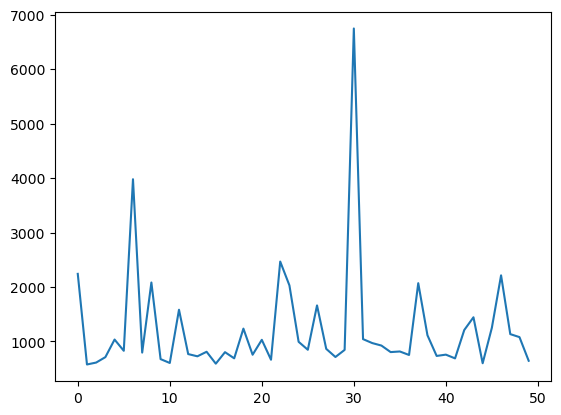

In [35]:
import matplotlib.pyplot as plt
plt.plot(loss_history)

In [36]:
torch.save(net.state_dict(),'unet_2.pth')

In [ ]:
# Install latest Tensorflow build
# !pip install -q tf-nightly-2.0-preview
import datetime
from tensorflow import summary
import tensorflow as tf
%load_ext tensorboard

In [33]:
current_time = str(datetime.datetime.now().timestamp())
train_log_dir = 'logs/tensorboard/train/' + 'nan_num_0'
train_summary_writer = summary.create_file_writer(train_log_dir)

Test

In [7]:
net = Unet.UNet(3,17).to(device)
net.load_state_dict(torch.load('unet_2.pth'))

c:\Users\28340\anaconda3\envs\fyp\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\28340\anaconda3\envs\fyp\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [16]:
datas = dataset[0]

In [19]:
# select one image pair to test
data = np.load('data.npz',mmap_mode='r')
test_image_0, test_image_1, test_image_q, test_depth_0, test_depth_1, test_depth_q, test_extrinsic0, test_extrinsic1 = datas
test_r0_index = dataset.ref1_index[0]
test_q_index = dataset.query_index[0]
test_q_extrinsic= torch.from_numpy(data['transforms'][test_q_index]).float().view(4,4).to(device)
test_extrinsic0 = test_extrinsic0.view(4,4)
test_extrinsic1 = test_extrinsic1.view(4,4)
K = torch.from_numpy(data['K']).float().to(device)
K[0] = K[0]/600
K[1] = K[1]/800
gamma = 0.02
damp = 0.001


In [23]:
torch.cuda.empty_cache()

In [24]:
# run gauss newton on the test image pair
pyramid_level = 3
depth_query_inResidual = test_depth_q
image_query_inResidual = test_image_q
image_r = test_image_0
Tqr = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=1, damping=damp)

OutOfMemoryError: CUDA out of memory. Tried to allocate 6.44 GiB (GPU 0; 6.00 GiB total capacity; 601.55 MiB already allocated; 3.66 GiB free; 630.00 MiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [63]:
gt_Tqr_rotmat = relative_transformation_carla(test_q_extrinsic,test_extrinsic0)
Tqr_R_rotmat = roma.rotvec_to_rotmat(Tqr[-1][0:3]).view(3,3).to(device)
Tqr_mat = torch.cat((Tqr_R_rotmat,Tqr[-1][3:6].view(3,1)),1)

In [64]:
Tqr_mat, gt_Tqr_rotmat

(tensor([[ 9.9998e-01, -8.6868e-04, -6.8240e-03, -1.4101e-02],
         [ 8.5934e-04,  1.0000e+00, -1.3700e-03, -2.3583e-02],
         [ 6.8252e-03,  1.3641e-03,  9.9998e-01, -4.2339e-03]], device='cuda:0',
        grad_fn=<CatBackward0>),
 (tensor([[ 9.9997e-01, -7.3929e-03,  4.4817e-04],
          [ 7.3929e-03,  9.9997e-01,  1.1179e-04],
          [-4.4899e-04, -1.0847e-04,  1.0000e+00]], device='cuda:0'),
  tensor([[8.2345e-02],
          [1.9776e+02],
          [6.7347e+01]], device='cuda:0')))

In [65]:
# visualize the result, show query iamge, ref image, and reprojected query image
reprojected_query_image = reproject(test_depth_q, test_image_q, K, Tqr_R_rotmat, Tqr[-1][3:6].view(3,1))

In [71]:
reprojected_query_image.cpu().detach().squeeze().permute(1,2,0).numpy()

(600, 800, 3)

Text(0.5, 1.0, 'query image')

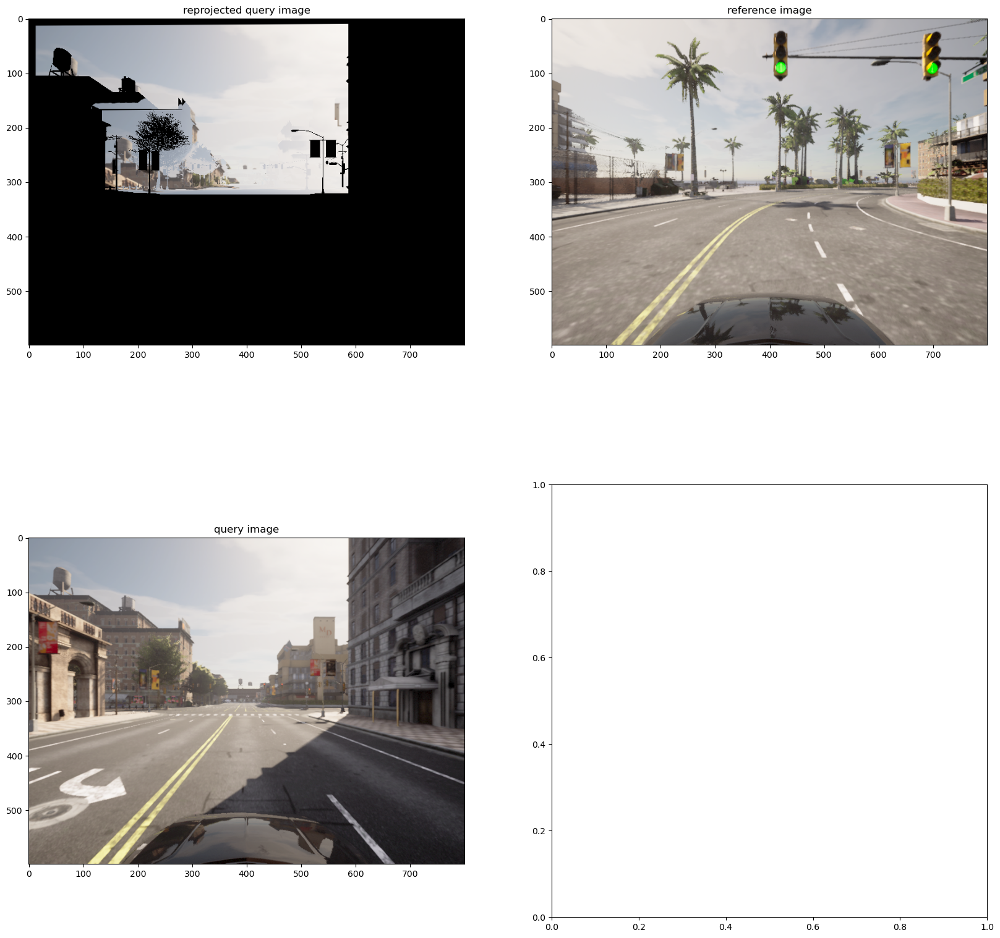

In [85]:
fig,ax =  plt.subplots(2,2,figsize=(20,20))
ax[0,0].imshow(reprojected_query_image.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax[0,1].imshow(test_image_0.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax[1,0].imshow(test_image_q.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax[0,0].set_title('reprojected query image')
ax[0,1].set_title('reference image')
ax[1,0].set_title('query image')

In [9]:
# find a pair of close image 
test_r2_rgb = torch.from_numpy(data['rgbs'][0]).float().permute(2,0,1).unsqueeze(0).to(device)
test_r2_depth = torch.from_numpy(data['depths'][0]).float().unsqueeze(0).to(device)
test_r2_extrinsic= torch.from_numpy(data['transforms'][0]).float().view(4,4).to(device)
test_q_rgb = torch.from_numpy(data['rgbs'][1]).float().permute(2,0,1).unsqueeze(0).to(device)
test_q_depth = torch.from_numpy(data['depths'][1]).float().unsqueeze(0).to(device)
test_q_extrinsic= torch.from_numpy(data['transforms'][1]).float().view(4,4).to(device)

In [97]:
# run gauss newton on the test image pair
depth_query_inResidual = test_depth_q
image_query_inResidual = test_image_q
image_r = test_image_0
Tqr = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=5, damping=damp)
gt_Tqr_rotmat = relative_transformation_carla(test_q_extrinsic,test_extrinsic0)
Tqr_R_rotmat = roma.rotvec_to_rotmat(Tqr[-1][0:3]).view(3,3).to(device)
Tqr_mat = torch.cat((Tqr_R_rotmat,Tqr[-1][3:6].view(3,1)),1)
# visualize the result, show query iamge, ref image, and reprojected query image
reprojected_query_image = reproject(test_depth_q, test_image_q, K, Tqr_R_rotmat, Tqr[-1][3:6].view(3,1))

Text(0.5, 1.0, 'query image')

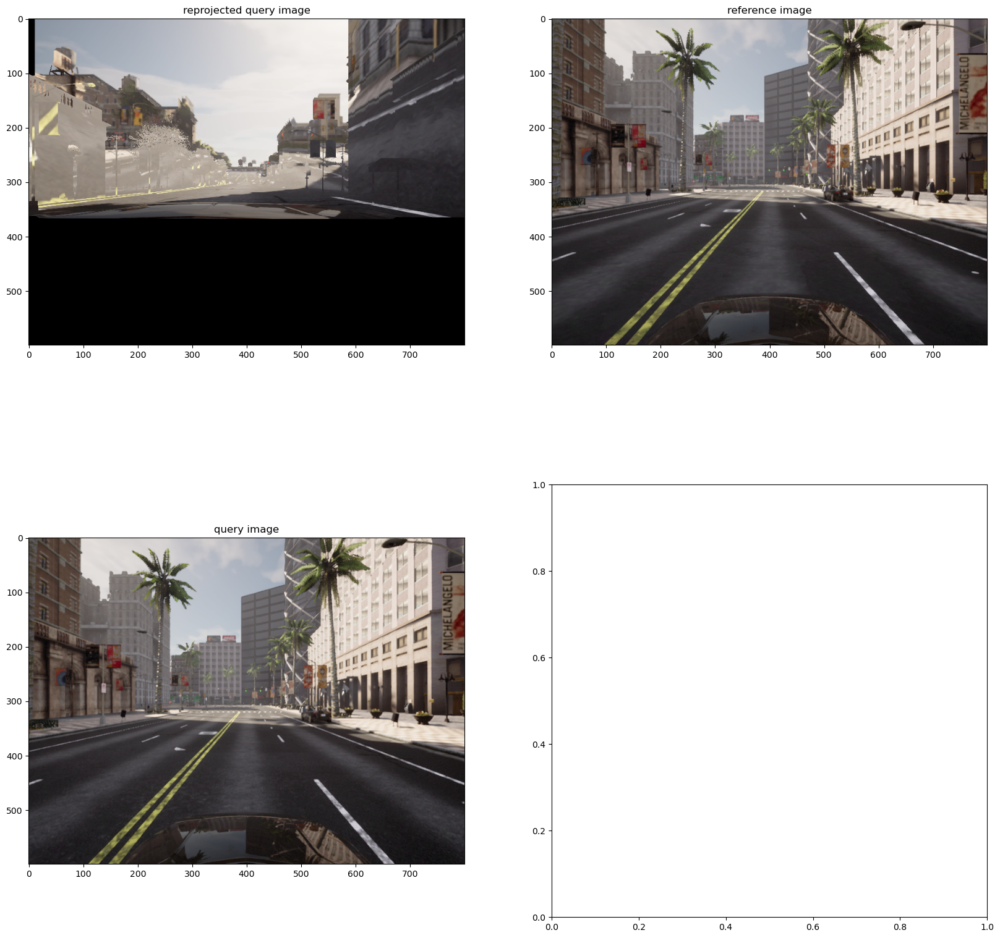

In [98]:
fig,ax2 =  plt.subplots(2,2,figsize=(20,20))
ax2[0,0].imshow(reprojected_query_image.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax2[0,1].imshow(test_r2_rgb.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax2[1,0].imshow(test_q_rgb.cpu().detach().squeeze().permute(1,2,0).numpy()/255)
ax2[0,0].set_title('reprojected query image')
ax2[0,1].set_title('reference image')
ax2[1,0].set_title('query image')

In [10]:
depth_query_inResidual = test_depth_q
image_query_inResidual = test_image_q
image_r = test_image_0
Tqr = gauss_newton(torch.Tensor([0,0,0,0,0,0]).float().to(device), residuals_depth, iterations=5, damping=damp)
gt_Tqr_rotmat = relative_transformation_carla(test_q_extrinsic,test_extrinsic0)
Tqr_R_rotmat = roma.rotvec_to_rotmat(Tqr[-1][0:3]).view(3,3).to(device)
Tqr_mat = torch.cat((Tqr_R_rotmat,Tqr[-1][3:6].view(3,1)),1)
# visualize the result, show query iamge, ref image, and reprojected query image
reprojected_query_image = reproject(test_depth_q, test_image_q, K, Tqr_R_rotmat, Tqr[-1][3:6].view(3,1))

NameError: name 'test_depth_q' is not defined